# **Préparez des données pour un organisme de santé publique**

![logo.JPG](data/img/logo.JPG)

L'agence "Santé publique France" a lancé un **appel à projets pour rendre les données de santé plus accessibles**.
L’agence souhaite faire explorer et visualiser des données, pour que ses agents puissent les exploiter.

L'anayse est basée sur le jeu de données <a href="https://world.openfoodfacts.org/">Open Food</a>

---

## Sommaire

<ol>
    <li><a href="#environnement">Environnement de développement</a></li>
        <ol>
            <li><a href="#installation">Installation de l'environnement</a></li>
            <li><a href="#librairies">Import des librairies</a></li>
            <li><a href="#fonctions">Fonctions utilitaires</a></li>
        </ol>
    <li><a href="#presentation">Présentation générale du jeu de données</a></li>
    <li><a href="#nettoyage">Nettoyage du jeu de données</a></li>
    <li><a href="#selection">Sélection des données à étudier</a></li>
    <li><a href="#analyse">Analyse des données sélectionnées</a></li>
        <ol>
            <li><a href="#varquali">Variables qualitatives</a></li>
                <ol>
                    <li><a href="#nettoyagequali">Nettoyage des variables qualitatives</a></li>
                    <li><a href="#uniquali">Analyse univariée des variables qualitatives</a></li>
                    <li><a href="#biquali">Analyse bivariée avec le nutrition_grade</a></li>
                </ol>
            <li><a href="#varquanti">Variables quantitatives</a></li>
                <ol>
                    <li><a href="#nettoyagequanti">Nettoyage des variables quantitatives</a></li>
                    <li><a href="#uniquanti">Analyse univariée des variables quantitatives</a></li>
                    <li><a href="#biquanti">Analyse bivariée entre chaque variable quantitative</a></li>
                    <li><a href="#correlation">Analyse des corrélations entre les variables quantitatives</a></li>
                </ol>
        </ol>
     <li><a href="#imputation">Imputation de données manquantes</a></li>
     <li><a href="#statistique">Analyse statistique du jeu de données</a></li>
        <ol>
            <li><a href="#analyseclean">Analyse après nettoyage et imputation des valeurs manquantes</a></li>
            <li><a href="#acp">Analyse en composantes principales (ACP)</a></li>
            <li><a href="#anova">ANOVA</a></li>
        </ol>
     <li><a href="#conclusion">Conclusion</a></li>
</ol>

<a id="environnement"></a>
# Environnement de développement

<a id="installation"></a>
### Installation de l'environnement

Un environnement virtuel a été créé pour assurer l’isolement du projet et la gestion des dépendances.
Les informations de cet environnement (son nom et ses dépendances) sont précisées dans le fichier **environment.yml**

L'installation de l'environnement virtuel est possible à partir de ce fichier, dans un invite de commande lancer la commande :

<code>conda env create -f environment.yml</code>

<a id="librairies"></a>
### Import des librairies

In [1]:
# Import des librairies python spécialisées dans le Jupyter Notebook
import pandas as pd
import numpy as np
import missingno as msno

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn import decomposition, preprocessing
from sklearn.impute import KNNImputer

import math

In [3]:
# Réglage des graphiques
plt.style.use('seaborn-whitegrid')

plt.rc('font', size=12)
plt.rc('axes', titlesize=20)
plt.rc('axes', labelsize=20)
plt.rc('xtick', labelsize=12)
plt.rc('ytick', labelsize=12)
plt.rc('legend', fontsize=12)

dims_fig = (25,35)

<a id="fonctions"></a>
### Fonctions utilitaires

Fonctions utilisées pour automatiser l'analyse des données

In [50]:
######################################## Description des données #######################################

# Affiche la taille du jeu de données
def displayDataShape(data):
    shape = data.shape
    print(f"Le jeu de données contient : {shape[0]} lignes et {shape[1]} colonnes\n")

# Affichage des Nan en %
def displayNanPercent(data):
    missing_values = pd.DataFrame((data.isna().mean()*100).sort_values())
    missing_values.columns = ['Valeurs manquantes en %']
    return missing_values

# Affiche le nombre de valeurs uniques pour chaque colonne dans le tableau passé en paramètres
def displayNbrUnique(data, columns):
    nbr_uniques = []

    for column in columns:
        nbr_uniques.append(data[column].nunique())

    return pd.Series(nbr_uniques, index=columns)

# Affiche les informations supprimées entre le data et le data nettoyé
def displayInfosDataCleaned(data, data_cleaned):
    print(f"Nombre de lignes supprimées : {data.shape[0] - data_cleaned.shape[0]}")
    print(f"Nombre de colonnes supprimées : {data.shape[1] - data_cleaned.shape[1]}")
    print(f"Colonnes supprimées : {[col for col in data.columns if col not in data_cleaned.columns]}\n")
    displayDataShape(data_cleaned)


######################################## Nettoyage et Manipulation des données #######################################

# Supprime les colonnes dont le taux de remplissage est inférieur à la valeur (limit_nan) en paramètre
def filterDataColumnByNan(data, limit_nan=0.75):
    return data[data.columns[data.isna().mean() <= limit_nan]].copy()

# Supprime les lignes dont les valeurs nutritionnelles ne sont pas renseignées
def filterDataRowByNan(data, limit_nan=1):
    nutriment_amount_tag = "_100g"
    data_columns_filtered = data[[col for col in data.columns if col.endswith(nutriment_amount_tag)]]
    index_with_nan = data_columns_filtered.index[data_columns_filtered.isnull().mean(axis=1) == limit_nan]

    return data.drop(index=index_with_nan).copy()

# Supprime les lignes dont les valeurs de la colonne en paramètre sont nulles
def filterDataRowByNanInColumn(data, column_name):
    return data[data[column_name].notna()].copy()

# Retourne 2 tableaux contenant les noms des variables quantitatives et qualitatives
def categoriseVariables(data):
    infos_type = data.dtypes
    quantitative_columns = []
    qualitative_columns = []

    for index in infos_type.index:
        if (infos_type[index] == 'float') | (infos_type[index] == 'int'):
            quantitative_columns.append(index)
        else:
            qualitative_columns.append(index)

    return quantitative_columns, qualitative_columns

# Transforme les valeurs des colonnes en minuscules
def lowerStringInColumns(data, columns):
    new_data = data.copy()
    for column in columns:
        new_data[column] = new_data[column].str.lower()

    return new_data

# Supprime les valeurs en dehors d'un interval donnée dans les colonnes
def cleanDataOutInterval(data, columns, min, max):
    for column in columns:
        if "_100g" in column and "energy" not in column and "score" not in column:
            data[column] = data[column].apply(replaceMinMaxInColumn, args=(min, max, np.nan))

    return data.copy()

# Remplace les valeurs à 0 dans les colonnes par la valeur NaN
def cleanZeroValuesInData(data, columns):
    for column in columns:
        data[column] = data[column].apply(replaceValuesInColumn, args=(0, np.nan))

    return data.copy()

# Remplace une valeur spécifique dans les colonnes par une nouvelle valeur
def cleanDataQuali(data, columns, old_value, new_value):
    for column in columns:
        data[column] = data[column].apply(replaceValuesInColumn, args=(old_value, new_value))

    return data.copy()

# Remplace les valeurs en dehors d'un interval donnée par une nouvelle valeur
def replaceMinMaxInColumn(value, min, max, new_value):
    if (value < min) | (value > max):
        value = new_value
    return value

# Remplace une valeur spécifique par une nouvelle valeur
def replaceValuesInColumn(value, old_value, new_value):
    if value == old_value:
        value = new_value

    return value

# Supprime les outliers dans les colonnes par la méthode de l'écart inter-quartile
def removeOutliers(data, columns):
    Q1 = data[columns].quantile(0.25)
    Q3 = data[columns].quantile(0.75)
    EI = Q3 - Q1

    outliers = (data[columns] >= (Q1 - 1.5 * EI)) & (data[columns] <= (Q3 + 1.5 * EI))

    return outliers

# Imputation des valeurs manquantes par le knn
def imputationForNutriScoreAndGrade(data, quanti, nutri_grade):
    # Avant d'imputer les valeurs manquantes de nutrition-grade (qui sont des valeurs qualitatives), on encode les valeurs pour qu'elles soient numériques
    le = preprocessing.LabelEncoder()
    le.fit(data['nutrition_grade_fr'])
    data['nutrition_grade_fr'] = np.where(le.transform(data['nutrition_grade_fr']) == 5, np.nan, le.transform(data['nutrition_grade_fr']))

    data_quanti = data[quanti + nutri_grade].copy()

    # Ici on impute les valeurs manquantes pour nutrition-grade en utilisant le knn
    imputer = KNNImputer(n_neighbors=5)
    data_quanti[quanti + nutri_grade] = imputer.fit_transform(data_quanti[quanti + nutri_grade])

    data_quanti['nutrition_grade_fr'] = data_quanti['nutrition_grade_fr'].apply(math.floor)
    # On décode les valeurs de nutrition-grade pour retrouver les valeurs sous formes qualitatives (de a à e)
    data_quanti['nutrition_grade_fr'] = le.inverse_transform(data_quanti['nutrition_grade_fr'])

    data[quanti + nutri_grade] = data_quanti.copy()

    nutrition_grade_map = {}
    # On ajoute dans un dictionnaire chaque valeur du nutri-grade avec la moyenne des nutri-score associés
    for value in data['nutrition_grade_fr'].unique():
        nutrition_grade_map[value] = data['nutrition-score-fr_100g'][data['nutrition_grade_fr'] == value].mean()

    # On impute les valeurs manquantes de nutrition-score avec la moyenne coresspondant au bon nutrition-grade
    for index in data.index:
        if str(data['nutrition-score-fr_100g'][index]) == 'nan':
            data['nutrition-score-fr_100g'][index] = nutrition_grade_map[data['nutrition_grade_fr'][index]]

    return data.copy()


######################################## Affichage des graphiques #######################################

# Affiche les histogrammes des variables nutritionnelles
def drawHist(data, columns, dims_fig):
    nbr_rows = int(len(columns)/3) + 1
    index = 1
    plt.figure(figsize=dims_fig)
    for column in columns:
        plt.subplot(nbr_rows, 3, index)
        plt.hist(data[column])
        plt.xlabel(f"{column}")
        plt.ylabel("Nombre d'aliments")
        plt.title(f"Histogramme - {column}")
        index += 1
    plt.show()

# Affiche les boîtes à moustaches des variables nutritionnelles
def drawBoxPlot(data, columns, dims_fig):
    nbr_rows = int(len(columns)/3) + 1
    index = 1
    plt.figure(figsize=dims_fig)
    for column in columns:
        plt.subplot(nbr_rows, 3, index)
        sns.boxplot(x=data[column])
        plt.xlabel(column)
        plt.title(f"Boite à moustaches pour {column}")
        index += 1
    plt.show()

# Affiche les diagrammes en camembert des variables qualitatives
def drawPieplot(data, columns, dims_fig):
    nbr_rows = int(len(columns)/2) + 1
    index = 1
    #plt.figure(figsize=dims_fig)
    for column in columns:
        values_name = data[column].value_counts().index
        data_sum = data[column].value_counts()
        iteration = 0
        for value in values_name:
            if iteration >= 30:
                break
            elif data_sum[value]/data_sum.sum()*100 >= 1.5:
                iteration+= 1
            else:
                break

        data_bis = data[column].where(data[column].isna() | data[column].isin(data[column].value_counts().index[:iteration]), other='other')

        if 'other' not in data_bis.value_counts().index:
            plt.subplot(nbr_rows, 2, index)
            data_bis.value_counts().plot.pie(figsize=dims_fig,
                                                autopct='%1.1f%%',
                                                startangle = 60,
                                                rotatelabels = True,
                                                pctdistance = 0.85)
            plt.ylabel("Nombre d'aliments")
            plt.title(f"Répartition des aliments par {column}", pad=50)
            index += 1
        elif data_bis.value_counts()['other']/data_bis.value_counts().sum()*100 < 60:
            plt.subplot(nbr_rows, 2, index)
            data_bis.value_counts().plot.pie(figsize=dims_fig,
                                             autopct='%1.1f%%',
                                             startangle = 60,
                                             rotatelabels = True,
                                             pctdistance = 0.85)
            plt.ylabel("Nombre d'aliments")
            plt.title(f"Répartition des aliments par {column}", pad=50)
            index += 1
    plt.show

# Affiche la répartion des variables qualitatives par nutrition_grade
def drawRepartitionHist(data, columns, repartition_column):
    columns_copy = columns.copy()
    columns_copy.remove(repartition_column)

    REPARTITION_VALUES = []
    for value in data[repartition_column].unique():
        if (str(value) != 'nan'):
            REPARTITION_VALUES.append(value)

    REPARTITION_VALUES.sort()

    for column in columns_copy:
        values_name = data[column].value_counts().index
        data_sum = data[column].value_counts()
        iteration = 0
        for value in values_name:
            if iteration >= 30:
                break
            elif data_sum[value]/data_sum.sum()*100 >= 1.5:
                iteration+= 1
            else:
                break

        if iteration != 0:
            top_values = f'top_{column}'

            data.loc[:,top_values] = data[column].where(data[column].isna() | data[column].isin(data[column].value_counts().index[:iteration]), other='other')

            TOP_VALUES = tuple(data[top_values].value_counts().index)

            fig = px.histogram(data.loc[data[top_values] != 'other'].loc[data[top_values].notnull() & data[repartition_column].notnull()],
                               x=top_values,
                               category_orders={repartition_column: REPARTITION_VALUES, top_values: TOP_VALUES},
                               color=repartition_column,
                               title=f'Répartion des {column} par {repartition_column}',
                               width=1200,
                               height=600,
                               )
            fig.show()

            data = data.drop(columns=top_values)

# Détermine les composantes principales
# Trace les éboulis des valeurs propres
# Affiche la projection des individus sur les différents plans factoriels
# Affiche les cercles de corrélations
def acpAnalysis(data, quanti_columns, nutri_grade_column):
    n = data[quanti_columns].shape[0]
    p = data[quanti_columns].shape[1]

    # Centrage et réduction des variables pour réaliser une ACP normée
    Z = pd.DataFrame(preprocessing.StandardScaler().fit_transform(X=data[quanti_columns]), data[quanti_columns].index)

    # On instancie l'object ACP
    acp = decomposition.PCA(svd_solver='full')
    # On récupère les coordonnées factorielles Fik pour chaque individu (projection des individus sur les composantes principales)
    coord = acp.fit_transform(Z)

    # Création d'un Datframe contenant les coordonnées factiorelles, le nom de chaque produit et le nom des colonnes correspondant à chaque composante principale
    projected_nutrition_data = pd.DataFrame(
        data=coord,
        index=Z.index,
        columns=[ f'F{i}' for i in range(1, p+1) ]
    )
    # On rajoute la colonne nutrition_grade
    projected_nutrition_data[nutri_grade_column] = data[nutri_grade_column]

    #valeur de la variance corrigée
    eigval = (n-1)/n*acp.explained_variance_
    eigval_ratio = (n-1)/n*acp.explained_variance_ratio_

    # On affiche l'éboulis des valeurs propres
    plt.plot(np.arange(1,p+1),eigval,c="red",marker='o')
    plt.title("Eboulis des valeurs propres")
    plt.ylabel("Valeur propre")
    plt.xlabel("Rang de l'axe d'inertie")
    plt.show()

    plt.bar(np.arange(1, p+1), eigval_ratio*100)
    plt.plot(np.arange(1, p+1), eigval_ratio.cumsum()*100,c="red",marker='o')
    plt.xlabel("Rang de l'axe d'inertie")
    plt.ylabel("Pourcentage d'inertie")
    plt.title("Eboulis des valeurs propres")
    plt.show(block=False)

    # On détermine le nombre de composantes à analyser
    # On ne considère pas comme importants les axes dont l'inertie associée est inférieue à (100/p)%
    k = np.where(eigval_ratio < 1/p)[0][0]

    if (k % 2) != 0:
        k -= 1

    print (f"Le nombre de composantes à analyser est de {k}")

    #racine carrée des valeurs propres
    sqrt_eigval = np.sqrt(eigval)

    #corrélation des variables avec les axes
    corvar = np.zeros((p,p))
    for j in range(p):
        corvar[:,j] = acp.components_[j,:] * sqrt_eigval[j]

    for i in range(0, k, 2):
        #--------------- projection des individus dans un plan factoriel ---------------
        fig, axes = plt.subplots(1, 2, figsize=(24,12))
        axes[0].set_xlim(projected_nutrition_data[f'F{i+1}'].min(),projected_nutrition_data[f'F{i+1}'].max())
        axes[0].set_ylim(projected_nutrition_data[f'F{i+2}'].min(),projected_nutrition_data[f'F{i+2}'].max())
        sns.scatterplot(
            ax=axes[0], x=f'F{i+1}',
            y=f'F{i+2}',
            data=projected_nutrition_data,
            hue=nutri_grade_column,
            hue_order=['a','b','c','d','e'])

        axes[0].set_xlabel(f'F{i+1}')
        axes[0].set_ylabel(f'F{i+2}')
        axes[0].set_title(f"Projection des individus sur 'F{i+1}' et 'F{i+2}'")

        #ajouter les axes
        axes[0].plot([projected_nutrition_data[f'F{i+1}'].min(),projected_nutrition_data[f'F{i+1}'].max()],[0,0],color='silver',linestyle='--',linewidth=3)
        axes[0].plot([0,0],[projected_nutrition_data[f'F{i+2}'].min(),projected_nutrition_data[f'F{i+2}'].max()],color='silver',linestyle='--',linewidth=3)

        #--------------- cercle des corrélations ---------------
        axes[1].set_xlim(-1,1)
        axes[1].set_ylim(-1,1)

        #affichage des étiquettes (noms des variables)
        for j in range(p):
            axes[1].annotate(data[quanti + [nutri_grade_column]].columns[j],(corvar[j,i],corvar[j,i+1]))
            axes[1].arrow(0, 0, corvar[j,i], corvar[j,i+1], length_includes_head=True, head_width=0.04)

        #ajouter un cercle
        cercle = plt.Circle((0,0),1,color='blue',fill=False)
        axes[1].add_artist(cercle)

        #ajouter les axes
        axes[1].plot([-1,1],[0,0],color='silver',linestyle='--',linewidth=3)
        axes[1].plot([0,0],[-1,1],color='silver',linestyle='--',linewidth=3)

        # nom des axes, avec le pourcentage d'inertie expliqué
        axes[1].set_xlabel('F{} ({}%)'.format(i+1, round(100*acp.explained_variance_ratio_[i],1)))
        axes[1].set_ylabel('F{} ({}%)'.format(i+2, round(100*acp.explained_variance_ratio_[i+1],1)))
        axes[1].set_title(f"Cercle des corrélations (F{i+1} et F{i+2})")

        #affichage
        plt.show()

# ANOVA entre chaque variable quantitative et la variable nutrition_grade
def anova_analysis(data,qualitative_col,quantitative_col,
                   figsize=(20,40)):

    modalites = [m for m in data[qualitative_col].unique() if str(m)!="nan"]
    modalites.sort()

    medianprops = {'color':"black"}
    meanprops = {'marker':'o', 'markeredgecolor':'black',
                 'markerfacecolor':'firebrick'}

    nbr_rows = int(len(quantitative_col)/2) + 1
    index = 1

    plt.figure(figsize=figsize)

    print("ANOVA entre chaque variable quantitative et la variable nutrition_grade")

    for column in quantitative_col:
        groupes = []
        for m in modalites:
            groupes.append(data[data[qualitative_col]==m][column])
        plt.subplot(nbr_rows, 2, index)
        plt.boxplot(groupes, labels=modalites,showfliers=False, medianprops=medianprops,
                    vert=True, patch_artist=True, showmeans=True, meanprops=meanprops)

        moyenne_y = data[column].mean()
        nutri_grades = []
        for modalite in modalites:
            yi_modalite = data[column][data[qualitative_col]==modalite]
            nutri_grades.append({'ni': len(yi_modalite),
                                 'moyenne': yi_modalite.mean()})
        SCT = sum([(yj-moyenne_y)**2 for yj in data[column]])
        SCE = sum([c['ni']*(c['moyenne']-moyenne_y)**2 for c in nutri_grades])
        result = round(SCE/SCT, 4)

        plt.title(f'ANOVA (Rapport de corrélation eta carré = {result})')
        plt.xlabel(qualitative_col)
        plt.ylabel(column)
        index += 1
    plt.show()

<a id="presentation"></a>
# Présentation générale du jeu de données

In [5]:
# Chargement du jeu de données dans un DataFrame
data = pd.read_csv("data/fr.openfoodfacts.org.products.csv", sep='\t', low_memory=False)
displayDataShape(data)

Le jeu de données contient : 320772 lignes et 162 colonnes



In [6]:
data.head(10)

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000...,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,NaN,1kg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0000000004530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,14.0,14.0,NaN,NaN
2,0000000004559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Peanuts,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN
3,0000000016087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,12.0,NaN,NaN
4,0000000016094,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055653,2017-03-09T10:34:13Z,1489055653,2017-03-09T10:34:13Z,Organic Polenta,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,0000000016100,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055651,2017-03-09T10:34:11Z,1489055651,2017-03-09T10:34:11Z,Breadshop Honey Gone Nuts Granola,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,0000000016117,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055730,2017-03-09T10:35:30Z,1489055730,2017-03-09T10:35:30Z,Organic Long Grain White Rice,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,0000000016124,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055711,2017-03-09T10:35:11Z,1489055712,2017-03-09T10:35:12Z,Organic Muesli,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,7.0,7.0,NaN,NaN
8,0000000016193,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055651,2017-03-09T10:34:11Z,1489055651,2017-03-09T10:34:11Z,Organic Dark Chocolate Minis,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,0000000016513,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055654,2017-03-09T10:34:14Z,1489055654,2017-03-09T10:34:14Z,Organic Sunflower Oil,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
print("Affichage du nombre de valeurs manquantes en % pour chaque colonne")
displayNanPercent(data)

Affichage du nombre de valeurs manquantes en % pour chaque colonne


,Valeurs manquantes en %
last_modified_t,0.000000
last_modified_datetime,0.000000
creator,0.000623
created_t,0.000935
created_datetime,0.002806
...,...
ingredients_that_may_be_from_palm_oil,100.000000
ingredients_from_palm_oil,100.000000
no_nutriments,100.000000
nervonic-acid_100g,100.000000


Affichage graphique du remplissage des colonnes


<AxesSubplot:>

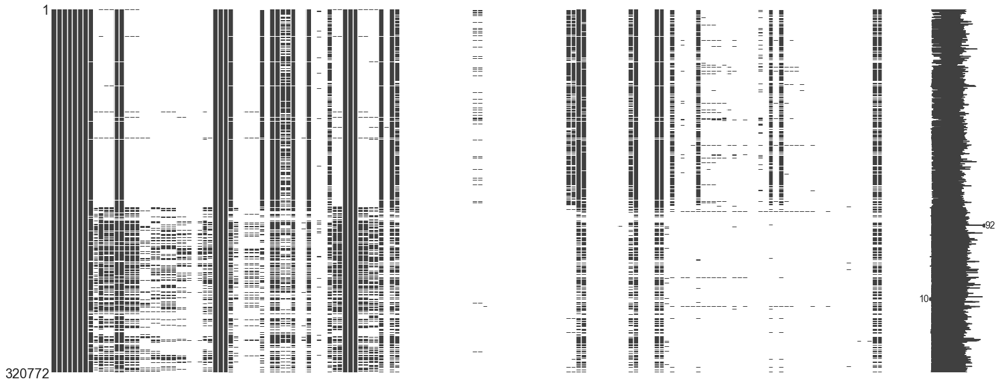

In [8]:
print("Affichage graphique du remplissage des colonnes")
msno.matrix(data)

Il y'a beaucoup de colonnes vides ou très peu remplies (plus de 75% de valeurs manquantes).

<a id="nettoyage"></a>
# Nettoyage du jeu de données

Avant de commencer l'analyse, il faut procéder à un nettoyage du jeu de données pour qu'il soit plus complet et plus uniforme.

On commence par supprimer les colonnes peu remplies, c'est à dire celles qui ont plus de 75% de valeurs manquantes

In [9]:
# Suppression des colonnes avec plus de 75% de valeurs manquantes
data_cleaned = filterDataColumnByNan(data)

On supprime ensuite les lignes dont aucune donnée nutritionnelle n'a été renseignée (les colonnes terminant par _100g)

In [10]:
# Suppression des lignes sans données nutritionnelles de renseignée
data_cleaned = filterDataRowByNan(data_cleaned)

On supprime les lignes dont le code ou le nom du produit n'est pas renseigné

In [11]:
# On supprime les lignes avec la valeur "code" ou "product name" vide
data_cleaned = filterDataRowByNanInColumn(data_cleaned, 'code')
data_cleaned = filterDataRowByNanInColumn(data_cleaned, 'product_name')

On vérifie si il y a des doublons pour le code des produits

In [12]:
data_cleaned[data_cleaned.duplicated('code')]

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,quantity,brands,...,fiber_100g,proteins_100g,salt_100g,sodium_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g,nutrition-score-fr_100g,nutrition-score-uk_100g


Il n'y pas de doublon à déclarer.

On affiche donc les informations du data après le nettoyage :

In [13]:
displayInfosDataCleaned(data, data_cleaned)

Nombre de lignes supprimées : 61338
Nombre de colonnes supprimées : 112
Colonnes supprimées : ['generic_name', 'packaging', 'packaging_tags', 'origins', 'origins_tags', 'manufacturing_places', 'manufacturing_places_tags', 'labels', 'labels_tags', 'labels_fr', 'emb_codes', 'emb_codes_tags', 'first_packaging_code_geo', 'cities', 'cities_tags', 'purchase_places', 'stores', 'allergens', 'allergens_fr', 'traces', 'traces_tags', 'traces_fr', 'no_nutriments', 'ingredients_from_palm_oil', 'ingredients_from_palm_oil_tags', 'ingredients_that_may_be_from_palm_oil', 'ingredients_that_may_be_from_palm_oil_tags', 'nutrition_grade_uk', 'image_url', 'image_small_url', 'energy-from-fat_100g', 'butyric-acid_100g', 'caproic-acid_100g', 'caprylic-acid_100g', 'capric-acid_100g', 'lauric-acid_100g', 'myristic-acid_100g', 'palmitic-acid_100g', 'stearic-acid_100g', 'arachidic-acid_100g', 'behenic-acid_100g', 'lignoceric-acid_100g', 'cerotic-acid_100g', 'montanic-acid_100g', 'melissic-acid_100g', 'monounsatura

Affichage graphique du remplissage des colonnes après le nettoyage


<AxesSubplot:>

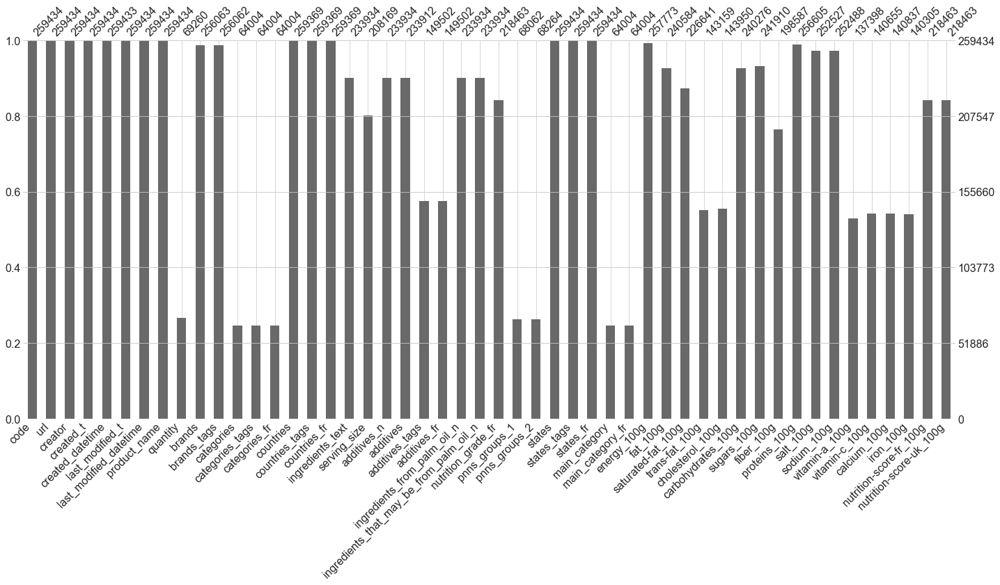

In [14]:
print("Affichage graphique du remplissage des colonnes après le nettoyage")
msno.bar(data_cleaned)

In [15]:
data_cleaned.head(20)

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,quantity,brands,...,fiber_100g,proteins_100g,salt_100g,sodium_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
1,0000000004530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,...,3.6,3.57,0.00000,0.000,0.000000,0.0214,0.000,0.00129,14.0,14.0
2,0000000004559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Peanuts,NaN,Torn & Glasser,...,7.1,17.86,0.63500,0.250,0.000000,0.0000,0.071,0.00129,0.0,0.0
3,0000000016087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,NaN,Grizzlies,...,7.1,17.86,1.22428,0.482,NaN,NaN,0.143,0.00514,12.0,12.0
4,0000000016094,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055653,2017-03-09T10:34:13Z,1489055653,2017-03-09T10:34:13Z,Organic Polenta,NaN,Bob's Red Mill,...,5.7,8.57,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,0000000016100,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055651,2017-03-09T10:34:11Z,1489055651,2017-03-09T10:34:11Z,Breadshop Honey Gone Nuts Granola,NaN,Unfi,...,7.7,13.46,NaN,NaN,NaN,NaN,0.038,0.00346,NaN,NaN
6,0000000016117,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055730,2017-03-09T10:35:30Z,1489055730,2017-03-09T10:35:30Z,Organic Long Grain White Rice,NaN,Lundberg,...,NaN,8.89,NaN,NaN,NaN,0.0027,0.044,NaN,NaN,NaN
7,0000000016124,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055711,2017-03-09T10:35:11Z,1489055712,2017-03-09T10:35:12Z,Organic Muesli,NaN,Daddy's Muesli,...,9.4,14.06,0.13970,0.055,NaN,NaN,0.062,0.00422,7.0,7.0
8,0000000016193,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055651,2017-03-09T10:34:11Z,1489055651,2017-03-09T10:34:11Z,Organic Dark Chocolate Minis,NaN,Equal Exchange,...,7.5,5.00,NaN,NaN,NaN,NaN,0.050,0.01125,NaN,NaN
9,0000000016513,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055654,2017-03-09T10:34:14Z,1489055654,2017-03-09T10:34:14Z,Organic Sunflower Oil,NaN,Napa Valley Naturals,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,0000000016612,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Adzuki Beans,NaN,Unfi,...,12.5,22.92,NaN,NaN,NaN,NaN,0.062,0.00450,NaN,NaN


In [16]:
displayDataShape(data_cleaned)

Le jeu de données contient : 259434 lignes et 50 colonnes



<a id="selection"></a>
# Sélection des données à étudier

Dans cette partie on va sélectionner les données intéressantes pour notre étude

On commence par catégoriser nos variables en 2 groupes : les variables **qualitatives** et **quantitatives**

In [17]:
quanti,quali = categoriseVariables(data_cleaned)
print(f"Variables quantitatives: \n{quanti}\n")
print(f"Variables qualitatives: \n{quali}")

Variables quantitatives: 
['additives_n', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g', 'saturated-fat_100g', 'trans-fat_100g', 'cholesterol_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g', 'vitamin-a_100g', 'vitamin-c_100g', 'calcium_100g', 'iron_100g', 'nutrition-score-fr_100g', 'nutrition-score-uk_100g']

Variables qualitatives: 
['code', 'url', 'creator', 'created_t', 'created_datetime', 'last_modified_t', 'last_modified_datetime', 'product_name', 'quantity', 'brands', 'brands_tags', 'categories', 'categories_tags', 'categories_fr', 'countries', 'countries_tags', 'countries_fr', 'ingredients_text', 'serving_size', 'additives', 'additives_tags', 'additives_fr', 'nutrition_grade_fr', 'pnns_groups_1', 'pnns_groups_2', 'states', 'states_tags', 'states_fr', 'main_category', 'main_category_fr']


À partir de cette catégorisation, on ne va garder que les colonnes pertinentes dans le cas de notre étude :

Pour les variables **qualitatives** on sélectionne :
- product_name
- nutrition_grade_fr
- pnns_groups_1
- pnns_groups_2
- main_category

Pour les variables **quantitatives** on sélectionne :
- energy_100g
- fat_100g
- saturated-fat_100g
- trans-fat_100g
- cholesterol_100g
- carbohydrates_100g
- sugars_100g
- fiber_100g
- proteins_100g
- salt_100g
- sodium_100g
- vitamin-a_100g
- vitamin-c_100g
- calcium_100g
- iron_100g
- nutrition-score-fr_100g

In [18]:
quali = ['product_name', 'nutrition_grade_fr', 'pnns_groups_1', 'pnns_groups_2', 'main_category']
quanti = ['energy_100g', 'fat_100g', 'saturated-fat_100g', 'trans-fat_100g', 'cholesterol_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g', 'vitamin-a_100g', 'vitamin-c_100g', 'calcium_100g', 'iron_100g', 'nutrition-score-fr_100g']

data_selection = data_cleaned[quali + quanti]

In [19]:
displayInfosDataCleaned(data_cleaned, data_selection)

Nombre de lignes supprimées : 0
Nombre de colonnes supprimées : 29
Colonnes supprimées : ['code', 'url', 'creator', 'created_t', 'created_datetime', 'last_modified_t', 'last_modified_datetime', 'quantity', 'brands', 'brands_tags', 'categories', 'categories_tags', 'categories_fr', 'countries', 'countries_tags', 'countries_fr', 'ingredients_text', 'serving_size', 'additives_n', 'additives', 'additives_tags', 'additives_fr', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n', 'states', 'states_tags', 'states_fr', 'main_category_fr', 'nutrition-score-uk_100g']

Le jeu de données contient : 259434 lignes et 21 colonnes



<a id="analyse"></a>
# Analyse des données sélectionnées
On va maintenant analyser notre jeu de données sélectionné en s'intéressant principalement au **nutrition_grade** des produtis, ainsi qu'à leurs **valeurs nuutritionnelles**.

<a id="varquali"></a>
## Variables qualitatives
On commence par analyser les données qualitatives

<a id="nettoyagequali"></a>
### Nettoyage des variables qualitatives
On effectue un second nettoyage un peu plus poussé sur les données qualitatives, afin d'uniformiser les données :

- On passe les valeurs en minuscule
- On remplace les valeurs à "unknown" par la valeur Nan

In [20]:
# On passe les valeurs en minuscule
data_selection = lowerStringInColumns(data_selection, quali)
# On remplace les valeurs à "unknown" par Nan
data_selection = cleanDataQuali(data_selection, quali, "unknown", np.nan)
data_selection[quali].head()

,product_name,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,main_category
1,banana chips sweetened (whole),d,NaN,NaN,NaN
2,peanuts,b,NaN,NaN,NaN
3,organic salted nut mix,d,NaN,NaN,NaN
4,organic polenta,NaN,NaN,NaN,NaN
5,breadshop honey gone nuts granola,NaN,NaN,NaN,NaN


<a id="uniquali"></a>
### Analyse univariée des variables qualitatives

In [21]:
displayNbrUnique(data_selection, quali)

product_name          183134
nutrition_grade_fr         5
pnns_groups_1             13
pnns_groups_2             36
main_category           2355
dtype: int64

On affiche les graphiques pour les colonnes ne présentant pas trop de valeurs uniques.
On regroupe les valeurs représentant moins de 1.5% des données dans une catégorie nommée 'other'

Graphiques pour les données qualitatives


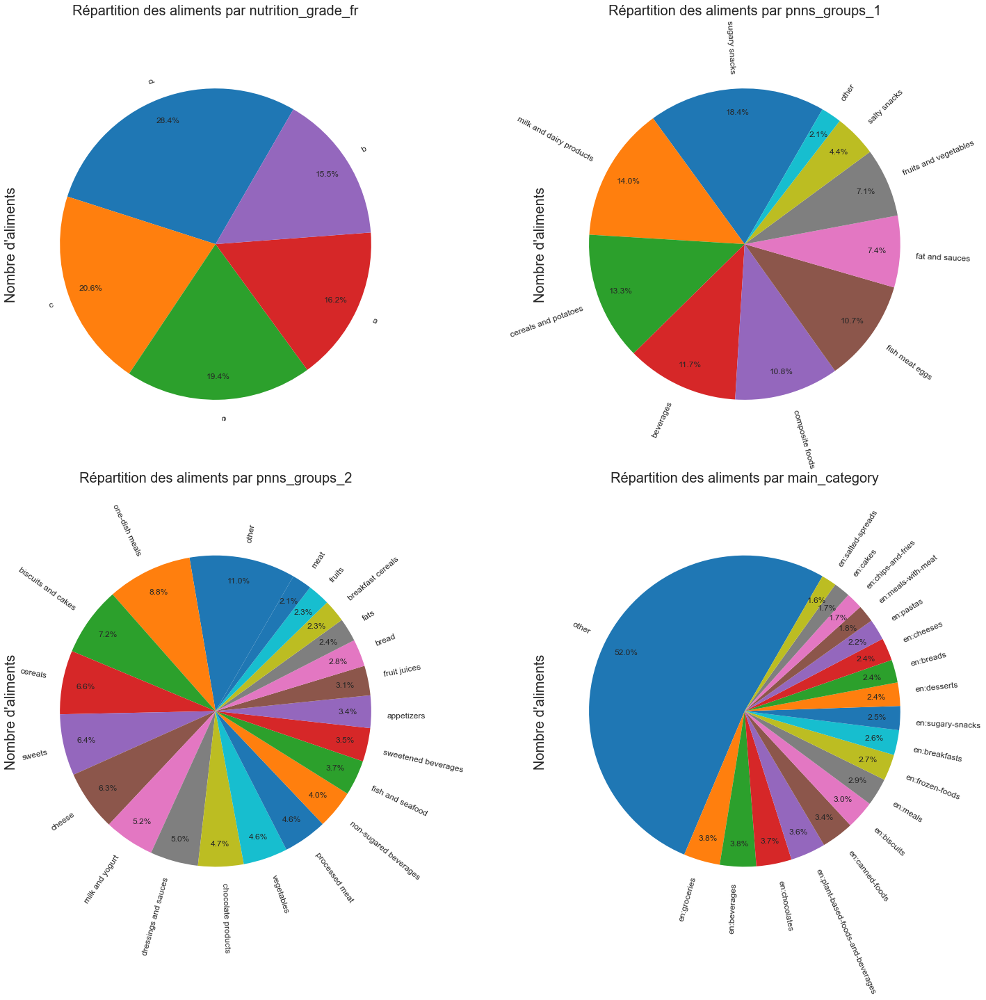

In [22]:
print("Graphiques pour les données qualitatives")
drawPieplot(data_selection, quali, dims_fig)

On voit que la répartition du **nutri-score** (noté de A à E) n'est pas uniforme, il y a une majorité de produits avec un mauvais nutriscore (C, D et E).

Les 19 **catégories** les plus courantes représentent environ 50% des produits.

Pour les différents **groupes d'aliments** (groupes 1 et 2), il y a une majorité de produits sucrés, laitiers ou céréales.

<a id="biquali"></a>
### Analyse bivariée avec le nutrition_grade

Ici on va afficher la répartition du nutrition_grade en fonction des autres variables qualitatives

In [23]:
drawRepartitionHist(data_selection, quali, 'nutrition_grade_fr')

On peut voir par exemple que les chocolats, biscuits, cakes, sugary snack ... ont généralement un mauvais nutri-score (D ou E), et que les canettes de nourriture, laits, céréales, fruits ... ont un bon nutri-score (A ou B)

<a id="varquanti"></a>
## Variables quantitatives
On analyse maintenant les données quantitatives

<a id="nettoyagequanti"></a>
### Nettoyage des variables quantitatives

On effectue un second nettoyage un peu plus poussé sur les données quantitatives, afin d'uniformiser les données :

- On supprime les valeurs inférieures à 0 et supérieures à 100 pour les données nutritionnelles
- On supprime les outliers par la méthode de l'inter-quartile pour les autres données
- On supprime les produits dont la somme en g des données nutritionnelles est supérieure à 100
- On supprime les produits dont l'énergie calculée est trop différente de l'énergie renseignée

In [24]:
data_selection[quanti].describe()

,energy_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g,nutrition-score-fr_100g
count,2.577730e+05,240584.000000,226641.000000,143159.000000,143950.000000,240276.000000,241910.000000,198587.000000,256605.000000,252527.000000,252488.000000,137398.000000,140655.00000,140837.000000,140305.000000,218463.000000
mean,1.140497e+03,12.701388,5.115709,0.073428,0.020079,32.091647,15.993129,2.863581,7.074330,2.037957,0.802467,0.000397,0.02335,0.125119,0.003654,9.151724
std,6.484434e+03,17.574028,8.008095,1.540612,0.358234,29.765368,22.345150,12.933636,8.418758,129.023620,50.800621,0.073320,2.23813,3.320757,0.214528,9.052588
min,0.000000e+00,0.000000,0.000000,-3.570000,0.000000,0.000000,-17.860000,-6.700000,-800.000000,0.000000,0.000000,-0.000340,-0.00210,0.000000,-0.000260,-15.000000
25%,3.730000e+02,0.000000,0.000000,0.000000,0.000000,6.000000,1.300000,0.000000,0.700000,0.063500,0.025000,0.000000,0.00000,0.000000,0.000000,1.000000
50%,1.100000e+03,5.000000,1.790000,0.000000,0.000000,20.600000,5.710000,1.500000,4.760000,0.584200,0.230000,0.000000,0.00000,0.035000,0.001010,10.000000
75%,1.674000e+03,20.000000,7.140000,0.000000,0.020000,58.500000,24.000000,3.600000,10.000000,1.379220,0.543000,0.000107,0.00370,0.106000,0.002400,16.000000
max,3.251373e+06,714.290000,550.000000,369.000000,95.238000,2916.670000,3520.000000,5380.000000,430.000000,64312.800000,25320.000000,26.700000,716.98110,694.737000,50.000000,40.000000


On voit que pour les données nutritionnelles (colonnes terminant par _100g) il y a des incohérences, il y a des valeurs négatives et des valeurs supérieures à 100 ce qui est impossible.
Pour l'énergie et le nutrition-score exprimé en valeur numérique il y a également des abérrations, ici on utilisera la méthode de l'inter-quartile

On va donc supprimer les valeurs en dessous de 0 et au dessous de 100 pour les colonnes suivantes :
- fat_100g
- saturated-fat_100g
- trans-fat_100g
- cholesterol_100g
- carbohydrates_100g
- sugars_100g
- fiber_100g
- proteins_100g
- salt_100g
- sodium_100g
- vitamin-a_100g
- vitamin-c_100g
- calcium_100g
- iron_100g

In [25]:
# Suppression des valeurs inférieures à 0 et supérieures à 100
data_selection_cleaned = cleanDataOutInterval(data_selection, quanti, 0, 100)

On va supprimer les outliers par la méthode de l'écart inter-quartiles, pour les colonnes suivantes :
- energy_100g
- nutrition-score-fr_100g


In [26]:
outliers = removeOutliers(data_selection_cleaned, ['energy_100g','nutrition-score-fr_100g'])
data_selection_cleaned[['energy_100g','nutrition-score-fr_100g']] = data_selection_cleaned[['energy_100g','nutrition-score-fr_100g']][outliers]
data_selection_cleaned[quanti].describe()

,energy_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g,nutrition-score-fr_100g
count,256709.000000,240580.000000,226638.000000,143150.000000,143950.000000,240258.00000,241892.000000,198582.000000,256601.000000,252371.000000,252454.000000,137397.000000,140651.000000,140827.000000,140304.000000,218459.000000
mean,1113.395627,12.696195,5.111649,0.067118,0.020079,32.07302,15.975216,2.833600,7.077845,1.593437,0.649009,0.000397,0.014532,0.101944,0.003654,9.151159
std,781.536587,17.497914,7.906154,0.944894,0.358234,29.16708,21.169760,4.591686,8.163246,6.261328,2.663027,0.073320,0.461745,0.585645,0.214529,9.051708
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-15.000000
25%,372.000000,0.000000,0.000000,0.000000,0.000000,6.00000,1.300000,0.000000,0.700000,0.063500,0.025000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,1093.000000,5.000000,1.790000,0.000000,0.000000,20.59000,5.710000,1.500000,4.760000,0.584200,0.230000,0.000000,0.000000,0.035000,0.001010,10.000000
75%,1674.000000,20.000000,7.140000,0.000000,0.020000,58.45750,24.000000,3.600000,10.000000,1.374140,0.543000,0.000107,0.003700,0.106000,0.002400,16.000000
max,3619.000000,100.000000,100.000000,100.000000,95.238000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,26.700000,100.000000,99.006000,50.000000,38.000000


Nos données quantitatives sont maintenant plus uniformes. Analysons comment les étudier :

Les données nutritionnelles principales sont :
- **fat_100g** (lipides), décliné ensuite par les données :
    - saturated-fat_100g
    - trans-fat_100g
    - cholesterol_100g
- **carbohydrates_100g** (glucides), décliné ensuite par les données :
    - sugars_100g
    - fiber_100g
- **proteins_100g** (protéines)
- **salt_100g**, décliné ensuite par :
    - sodium_100g

Ces données principales servent à calculer :
- **energy_100g**

Le calcul des calories d'un aliment s'effectue selon un processus normalisé au niveau européen et baptisé système « 4/4/9 »
Ce système implique que l'équivalent calorique d'un gramme de **protéines**, de **glucides** et de **lipides** - nos trois principaux « carburants » nutritionnels - correspond respectivement à **4, 4 et 9 kcal**.

1 gr de proteine apporte 4 kcal
1 gr de glucide (carbohydrate) apporte 4 kcal
1 gr de lipide apporte 9 kcal

On va rajouter 3 colonnes dans notre data :
- **sum_nutritional_elements_100g** : c'est la somme en g des données nutritionnelles principales (on ajoute le sel ici)
- **energy_calculated_100g** : c'est l'énergie calculée à partir des données nutritionnelles principales (on ne tient pas compte du sel)
- **energy_difference** : c'est la différence d'énergie entre celle calculée et celle renseignée


In [27]:
nutri = ['energy_100g','fat_100g', 'carbohydrates_100g', 'proteins_100g', 'nutrition_grade_fr']

sum_nutritional_elements = []
energy_calculated = []

for index in range(data_selection_cleaned[nutri].shape[0]):
    value_sum = data_selection_cleaned['fat_100g'].iloc[index] + data_selection_cleaned['carbohydrates_100g'].iloc[index] + data_selection_cleaned['proteins_100g'].iloc[index] + data_selection_cleaned['salt_100g'].iloc[index]
    value_energy = (data_selection_cleaned['fat_100g'].iloc[index]*9 + data_selection_cleaned['carbohydrates_100g'].iloc[index]*4 + data_selection_cleaned['proteins_100g'].iloc[index]*4)*4.187

    sum_nutritional_elements.append(value_sum)
    energy_calculated.append(value_energy)

data_selection_cleaned['sum_nutritional_elements_100g'] = sum_nutritional_elements
data_selection_cleaned['energy_calculated_100g'] = energy_calculated
data_selection_cleaned['energy_difference'] = abs(data_selection_cleaned['energy_100g'] - data_selection_cleaned['energy_calculated_100g'])

data_selection_cleaned[['sum_nutritional_elements_100g', 'energy_calculated_100g', 'energy_difference']].describe()

,sum_nutritional_elements_100g,energy_calculated_100g,energy_difference
count,233195.000000,238411.000000,237191.000000
mean,53.390081,1130.291358,59.553247
std,33.897665,812.105339,146.763682
min,0.000000,0.000000,0.000000
25%,20.636140,363.054770,7.644560
50%,51.942180,1108.424510,22.745000
75%,88.203350,1674.800000,57.127860
max,239.690000,6001.478320,4187.125610


Commencons par supprimer les produits dont la somme en g des valeurs nutritionnelles principales est supérieure à 100, car c'est impossible. Cela signifie que les données sont mal renseignées pour ce produit.

In [28]:
# Suppression des produits dont la somme des valeurs nutritionnelles principales est supérieure à 100
data_selection_cleaned = data_selection_cleaned[data_selection_cleaned['sum_nutritional_elements_100g'] <= 100]

Affichons maintenant le graphique représentant pour les produits la différence entre l'énergie renseignée et celle calculée

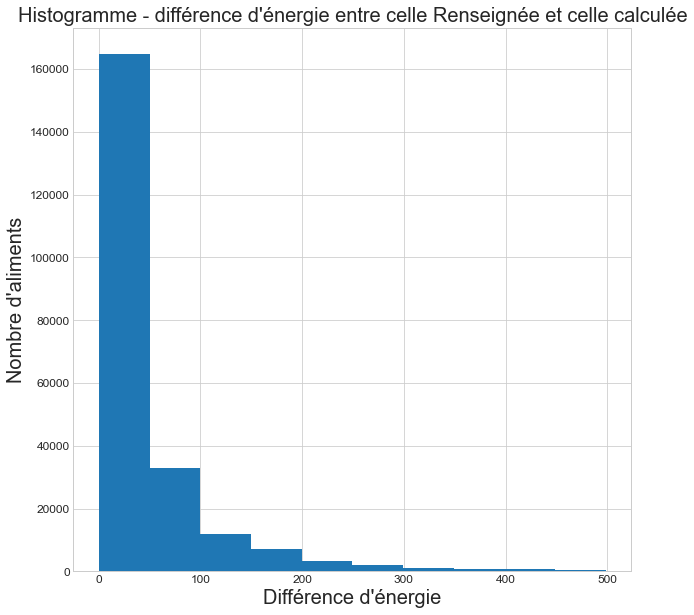

In [29]:
plt.figure(figsize=(10,10))
plt.hist(data_selection_cleaned['energy_difference'][data_selection_cleaned['energy_difference'] < 500])
plt.xlabel("Différence d'énergie")
plt.ylabel("Nombre d'aliments")
plt.title("Histogramme - différence d'énergie entre celle Renseignée et celle calculée")
plt.show()

On voit que pour la majorité des produits la différence d'énergie est très faible, ce qui signifie que notre calcul en utilisant les données nutritionnelles principales et le système 4/4/9 représente assez bien nos données.
On choisit ici de supprimer les produits qui ont une différence supérieure à 300 kJ (correspondant à 72 kcal), cela signifie qu'il manque des données nutritionnelles ou qu'elles sont mal renseignées.
Ceci nous permettra d'avoir des données plus pertinentes pour l'analyse

In [30]:
data_selection_cleaned = data_selection_cleaned[data_selection_cleaned['energy_difference'] <= 300]

In [31]:
data_selection_cleaned = data_selection_cleaned.drop(columns=['sum_nutritional_elements_100g', 'energy_calculated_100g', 'energy_difference'])

In [32]:
data_selection_cleaned[quanti].describe()

,energy_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g,nutrition-score-fr_100g
count,222245.000000,222245.000000,198023.000000,135098.000000,135715.000000,222245.000000,212184.000000,171290.000000,222245.000000,222245.000000,222222.000000,129925.000000,132881.000000,132880.000000,132530.000000,192466.000000
mean,1094.718453,12.198456,4.859993,0.063144,0.020091,31.262919,15.713362,2.713325,6.957271,1.543991,0.607933,0.000363,0.011288,0.101180,0.003540,8.996976
std,776.236035,16.626035,7.244601,0.917228,0.327477,28.658474,20.713074,3.872652,7.875833,6.134678,2.415342,0.074111,0.299065,0.594034,0.214334,9.018269
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-14.000000
25%,360.000000,0.000000,0.000000,0.000000,0.000000,5.930000,1.500000,0.000000,0.700000,0.066040,0.026000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,1069.000000,4.900000,1.790000,0.000000,0.000000,20.000000,5.830000,1.600000,4.650000,0.600000,0.236220,0.000000,0.000000,0.035000,0.000960,9.000000
75%,1644.000000,19.720000,7.140000,0.000000,0.022000,57.140000,23.500000,3.600000,10.000000,1.384300,0.545000,0.000107,0.003800,0.105000,0.002400,16.000000
max,3615.000000,100.000000,100.000000,100.000000,95.238000,100.000000,100.000000,100.000000,100.000000,100.000000,39.370079,26.700000,57.140000,99.006000,50.000000,37.000000


In [33]:
print("Affichage des informations sur le nouveau jeu de données")
displayInfosDataCleaned(data_selection, data_selection_cleaned)

Affichage des informations sur le nouveau jeu de données
Nombre de lignes supprimées : 37189
Nombre de colonnes supprimées : 0
Colonnes supprimées : []

Le jeu de données contient : 222245 lignes et 22 colonnes



<a id="uniquanti"></a>
### Analyse univariée des variables quantitatives

On affiche les boîtes à moustaches ainsi que les histogrammes pour chaque variable quantitative

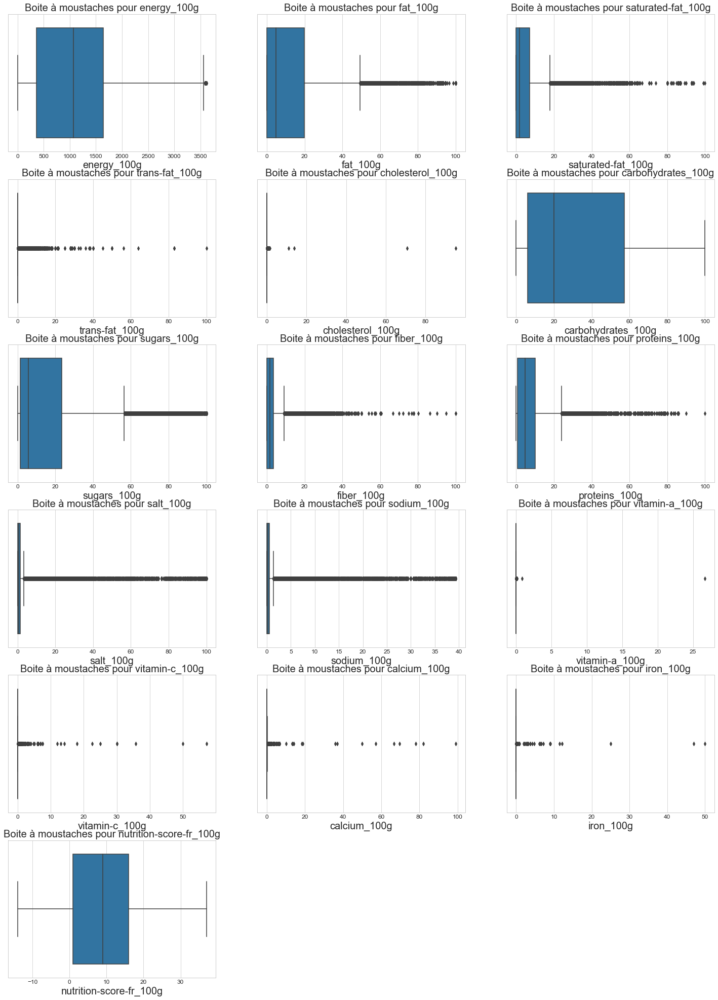

In [34]:
drawBoxPlot(data_selection_cleaned, quanti, dims_fig)

Si l'on se fie aux boîtes à moustaches on voit qu'il reste des outliers.
Cela est du à la trop grandes répartition des valeurs autour de 0 pour certaines variables.
Durant le nettoyage on a décidé de supprimer les valeurs en dessous de 0 et au dessus de 100 pour les données nutritionnelles, et de compléter le nettoyage en vérifiant le calcul de la somme des données nutritionnelles et le calcul de l'énergie.

La détermination des outliers avec la méthode de l'écart-interquartile n'est donc ici pas très pertinente, excepté pour l'énergie et le nutri-score mais les outliers ont été correctement supprimés lors du nettoyage.

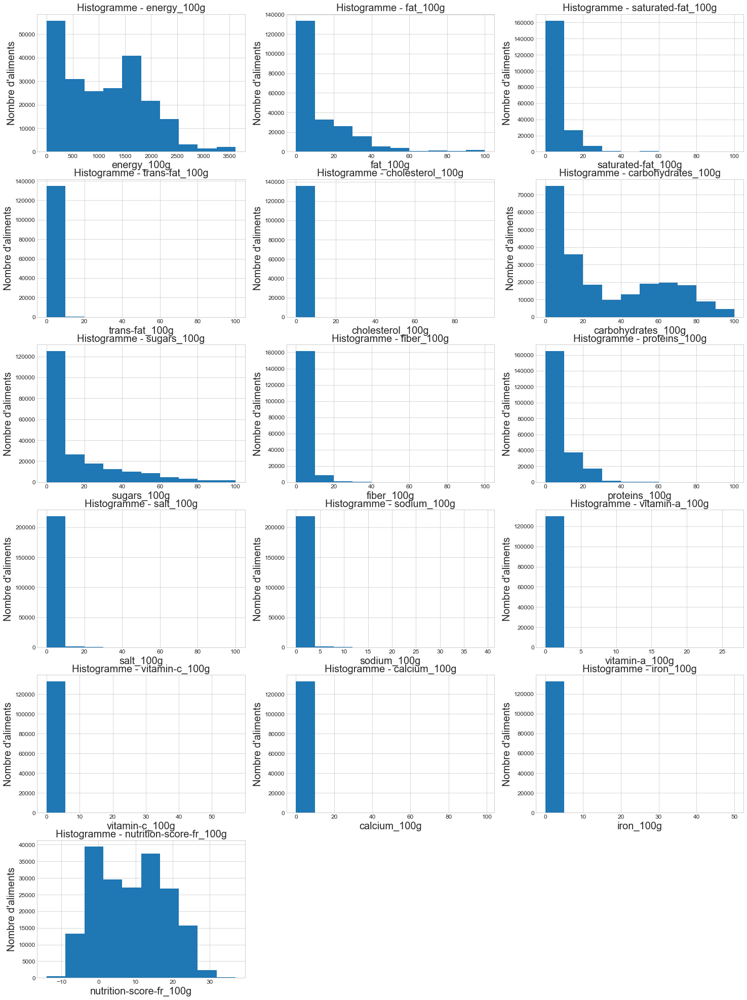

In [35]:
drawHist(data_selection_cleaned, quanti, dims_fig)

On voit que les variables qui ont une distribution plus étalée correspondent à nos trois principaux « carburants » nutritionnels, protéine, glucide et le gras, ainsi que l'énergie et le nutriscore.
Les autres variables étant des déclinaisons des principaux carburants sont moins souvent présente, d'ou leur plus grande répartion autour des petites valeurs.

Pour la suite de l'étude on va réduire les valeurs quantitatives sélectionnées.
On ne va pas garder celles qui ont beaucoup trop de valeurs autour de 0.
On ne va étudier que les variables ayant une répartion des valeurs assez importante pour pouvoir les comparer avec la variation d'énergie et le nutriscore.

Variables quantitatives sélectionnnées :
- energy_100g
- fat_100g
- saturated-fat_100g
- carbohydrates_100g
- sugars_100g
- fiber_100g
- proteins_100g
- salt_100g
- sodium_100g
- nutrition-score-fr_100g

In [36]:
quanti = ['energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g']

data_selection_cleaned = data_selection_cleaned[quali + quanti].copy()
data_selection_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 222245 entries, 1 to 320768
Data columns (total 15 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   product_name             222245 non-null  object 
 1   nutrition_grade_fr       192467 non-null  object 
 2   pnns_groups_1            47646 non-null   object 
 3   pnns_groups_2            47729 non-null   object 
 4   main_category            54524 non-null   object 
 5   energy_100g              222245 non-null  float64
 6   fat_100g                 222245 non-null  float64
 7   saturated-fat_100g       198023 non-null  float64
 8   carbohydrates_100g       222245 non-null  float64
 9   sugars_100g              212184 non-null  float64
 10  fiber_100g               171290 non-null  float64
 11  proteins_100g            222245 non-null  float64
 12  salt_100g                222245 non-null  float64
 13  sodium_100g              222222 non-null  float64
 14  nutr

<a id="biquanti"></a>
### Analyse bivariée entre chaque variable quantitative
Analysons maintenant les relations entre chaque variable quantitative

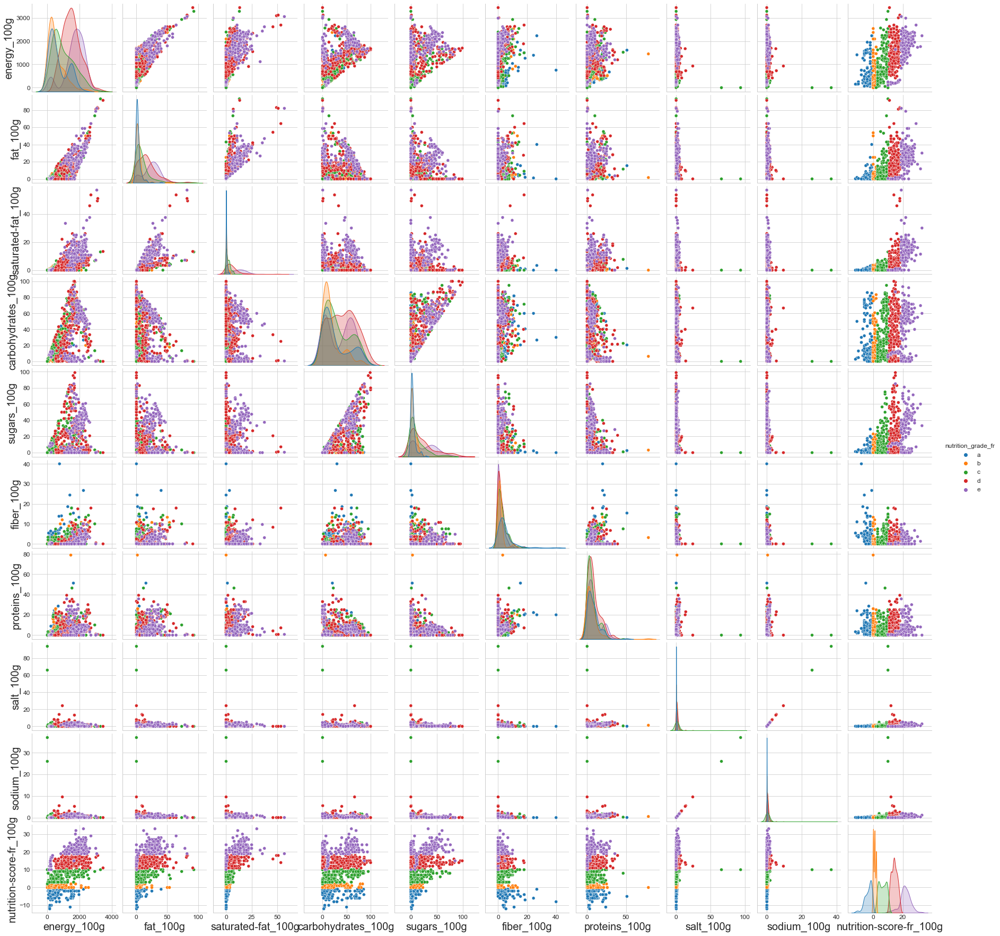

In [37]:
sns.pairplot(data_selection_cleaned.sample(1000,random_state=0).sort_values(by='nutrition_grade_fr'), hue='nutrition_grade_fr')
plt.show()

On remarque :

- Une corrélation entre les principaux carburants et leurs déclinaisons (fat avec saturated_fat, et carbohydrates avec sugars)
- une corrélation parfaite entre **salt_100g** et **sodium_100g** (ce qui est logique car le sodium est un composé du sel)
- L'énergie est le plus corrélé avec le gras, puis ensuite avec les glucides.
- Le nutri_score est beaucoup impacté par l'énergie (et donc le gras car ils sont corrélés)


<a id="correlation"></a>
### Analyse des corrélations entre les variables quantitatives
Regardons maintenant la matrice de corrélations

<AxesSubplot:>

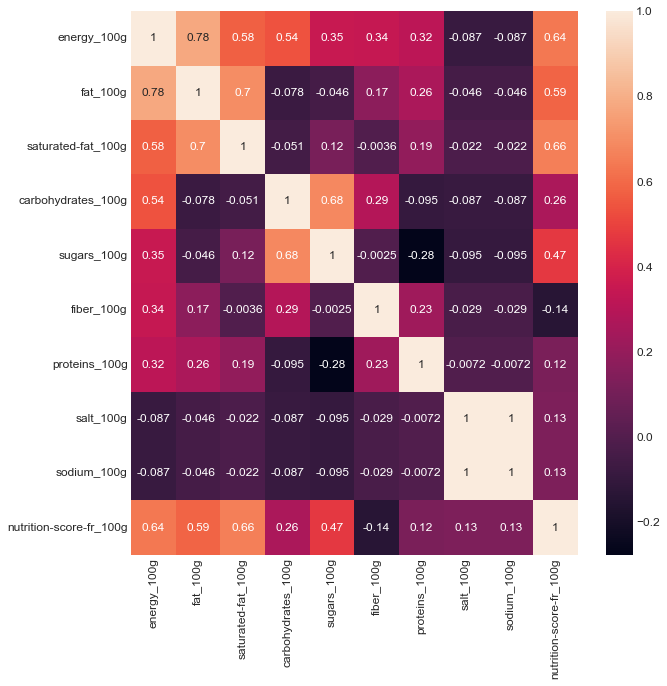

In [38]:
plt.figure(figsize = (10,10))
sns.heatmap(data_selection_cleaned.corr(), annot=True)

Les indices de corrélation entre chaque variable quantitative nous permettent d'affirmer les remarques faites précedemment, à savoir :
- Une corrélation entre les principaux carburants et leurs déclinaisons (fat avec saturated_fat, et carbohydrates avec sugars)
- une corrélation parfaite entre salt_100g et sodium_100g (ce qui est logique car le sodium est un composé du sel)
- L’énergie est le plus corrélé avec le gras, puis ensuite avec les glucides.
- Le nutri_score est beaucoup impacté par l’énergie (et donc le gras car ils sont corrélés)


<a id="imputation"></a>
## Imputation de données manquantes

Afon d'avoir un jeu de données plus complet pour pousser notre analyse, on va maintenant imputer les valeurs des données manquantes pour nos colonnes possédant encore un % de valeurs à Nan

In [39]:
displayNanPercent(data_selection_cleaned)

,Valeurs manquantes en %
product_name,0.000000
energy_100g,0.000000
fat_100g,0.000000
carbohydrates_100g,0.000000
proteins_100g,0.000000
salt_100g,0.000000
sodium_100g,0.010349
sugars_100g,4.526986
saturated-fat_100g,10.898783
nutrition_grade_fr,13.398727


<AxesSubplot:>

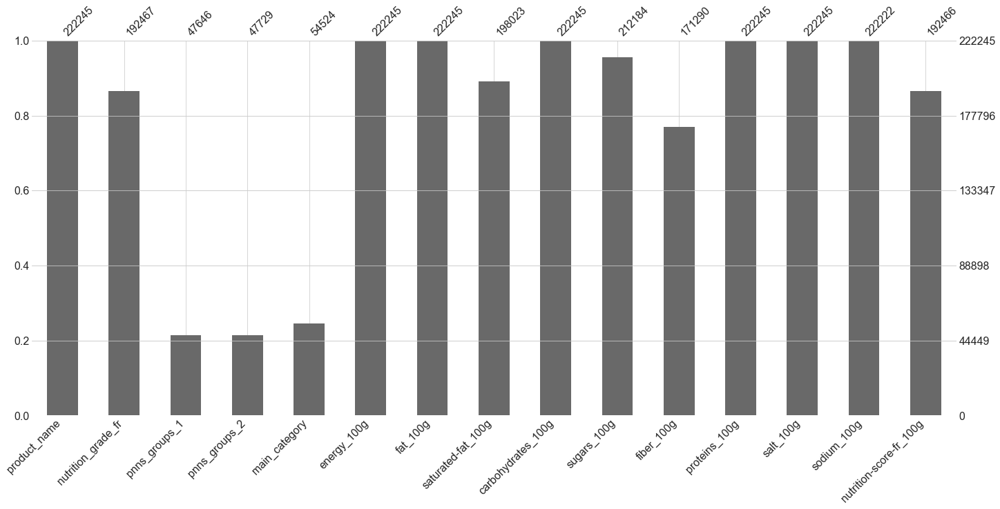

In [40]:
msno.bar(data_selection_cleaned)

On voit que les colonnes suivantes ne sont pas encore complètes :

- nutrition_grade_fr
- nutrition-score-fr_100g
- saturated-fat_100g
- sugars_100g
- fiber_100g

(On n'imputera pas les valeurs manquantes pour les variables qualitatives)

On va commencer par imputer les valeurs sur les données nutritionnelles par la médiane (et non par la moyenne car il y'a beaucoup d'outliers pour ces colonnes comme on a pu le voir avec les boîtes à moustaches)

In [41]:
print("Imputation des valeurs manquantes par la médiane pour les colonne suivantes : 'saturated-fat_100g', 'sugars_100g', 'fiber_100g'")
data_selection_cleaned['saturated-fat_100g'].fillna(data_selection_cleaned['saturated-fat_100g'].median(), inplace = True)
data_selection_cleaned['sugars_100g'].fillna(data_selection_cleaned['sugars_100g'].median(), inplace = True)
data_selection_cleaned['fiber_100g'].fillna(data_selection_cleaned['fiber_100g'].median(), inplace = True)

Imputation des valeurs manquantes par la médiane pour les colonne suivantes : 'saturated-fat_100g', 'sugars_100g', 'fiber_100g'


<AxesSubplot:>

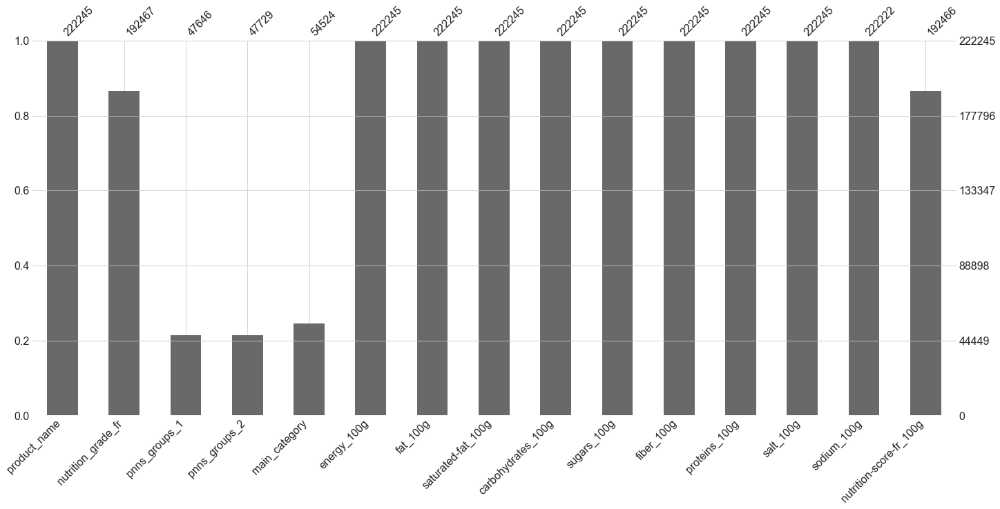

In [42]:
msno.bar(data_selection_cleaned)

Maintenant que toutes les données nutritionelles sont complètes, on va imputer les valeurs manquantes de la colonne 'nutrition_grade_fr' (valeurs notées de A à E), en utilisant l'algorithme knn (Méthode des k plus proches voisins), ce qui permet d'imputer les valeurs d'un produit selon les produits qui lui ressemble le plus.

Cette colonne une fois complète nous permettra de déterminer les valeurs manquantes de la colonne 'nutrition-score-fr_100g', ces 2 colonnes étant étroitement corrélées.
Pour ce faire, connaissant le nutrition-grade d'un produit, si son nutrition-score est manquant, on l'imputera avec la moyenne des nutrition-score dont le nutrition-grade est le même.

In [43]:
quanti = ['energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g']
nutri_score = ['nutrition-score-fr_100g']
nutri_grade = ['nutrition_grade_fr']
quali = ['main_category', 'pnns_groups_1', 'pnns_groups_2']

# Imputation des colonnes 'nutrition_grade_fr' et 'nutrition-score-fr_100g'
data_selection_cleaned = imputationForNutriScoreAndGrade(data_selection_cleaned, quanti, nutri_grade)

C:\Users\romai\AppData\Local\Temp/ipykernel_11448/3386411412.py:143: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<AxesSubplot:>

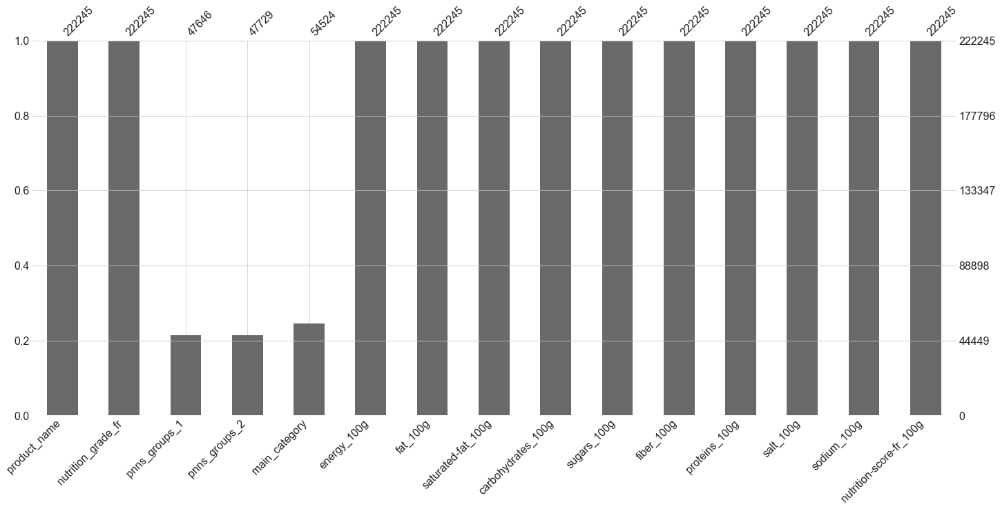

In [44]:
msno.bar(data_selection_cleaned)

Nos données quantitatives sont maintenant complètes, on va pouvoir aller un peu plus loin dans l'analyse des variables quantitatives.

<a id="statistique"></a>
## Analyse statistique du jeu de données
On commencera par une analyse générale de notre jeu de données, pour voir si les remarques faites précedemment sont toujours valables après l'imputation des données manquantes, on vérifie que notre jeu de données à toujours "la même tendance".
On fera ensuite une analyse descriptive du jeu de données.

<a id="analyseclean"></a>
### Analyse après nettoyage et imputation des valeurs manquantes

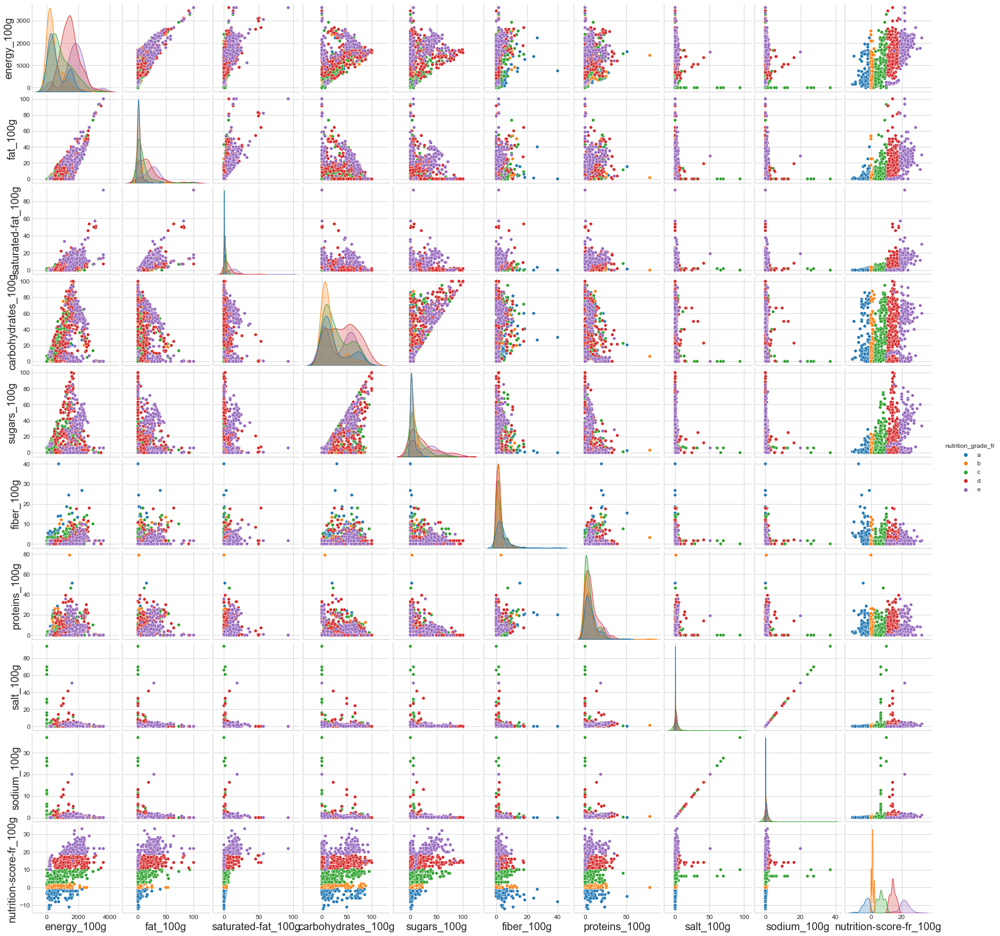

In [45]:
sns.pairplot(data_selection_cleaned.sample(1000,random_state=0).sort_values(by='nutrition_grade_fr'), hue='nutrition_grade_fr')
plt.show()

<AxesSubplot:>

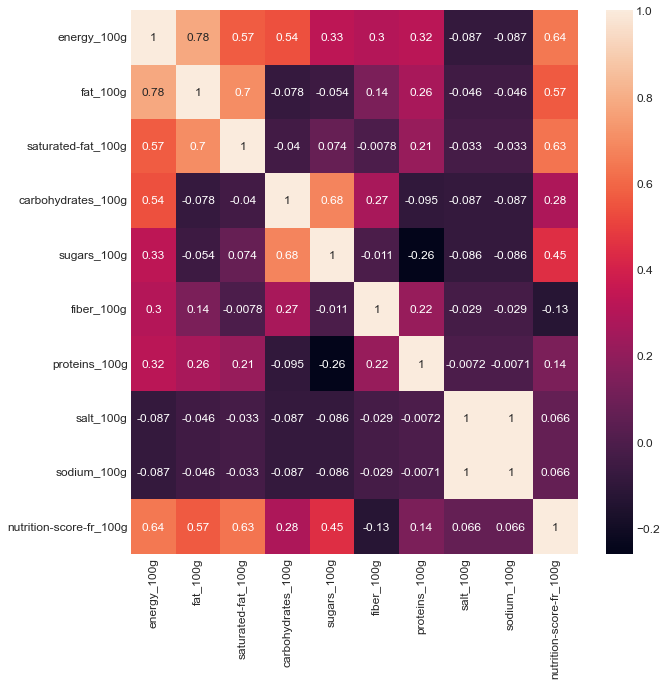

In [46]:
plt.figure(figsize = (10,10))
sns.heatmap(data_selection_cleaned.corr(), annot=True)

D'après l'analyse bivariée entre chaque variable quantitative et la matrice de corrélation, on remarque très peu de changement par rapport à la présente analyse faite avant l'imputation des données manquantes.
L'imputation des données manquantes n'a donc pas modifié la tendance de notre de jeu de données, mais il est maintenant complet et permet une analyse plus poussée.


<a id="acp"></a>
### Analyse en Composantes Principales (ACP)
On va ici étudier la variabilité entre les individus, ainsi que les liaisons entre les variables.

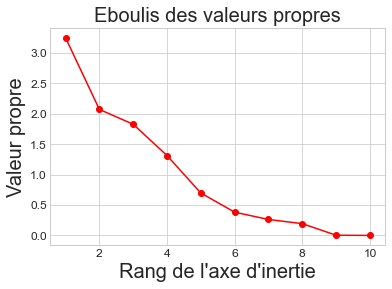

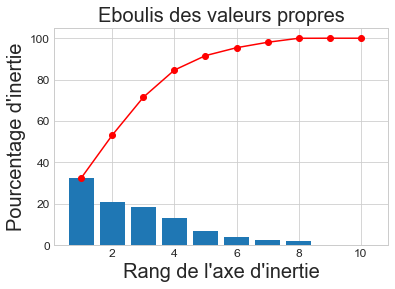

Le nombre de composantes à analyser est de 4


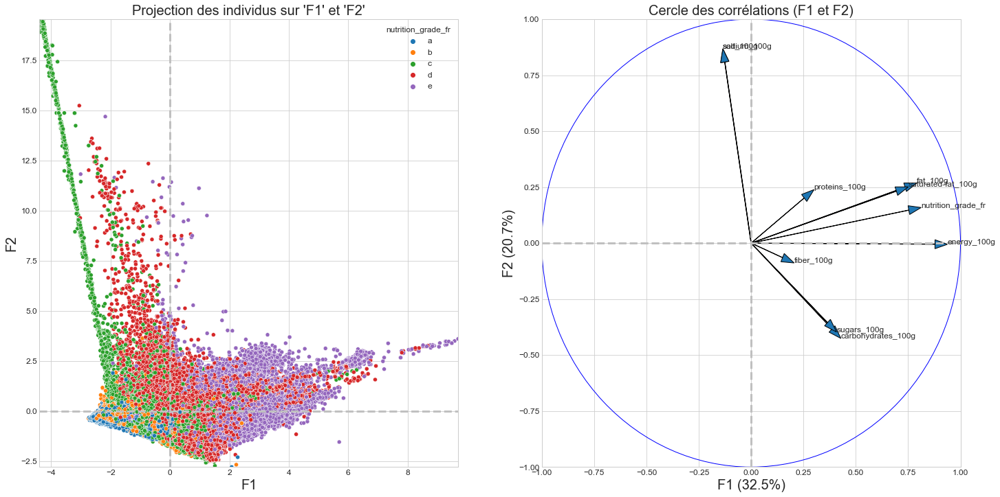

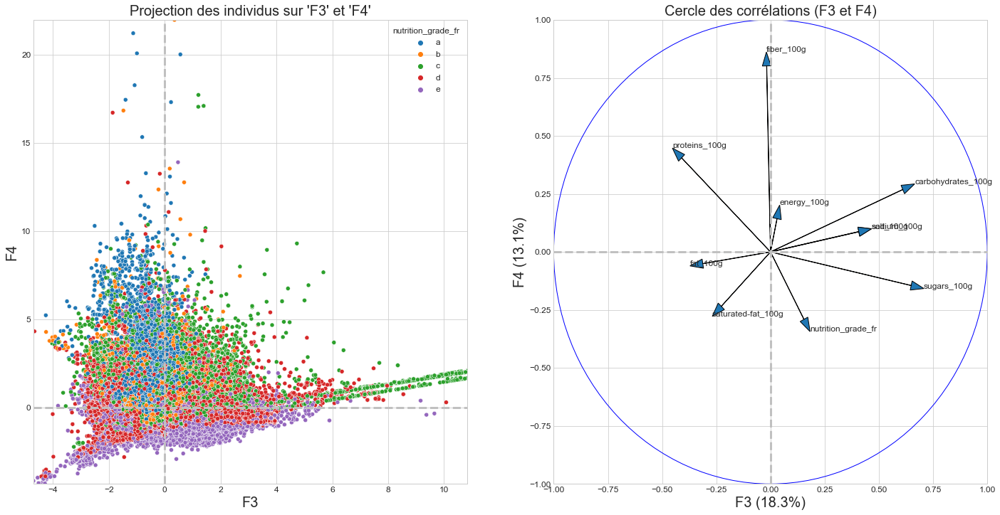

In [51]:
acpAnalysis(data_selection_cleaned, quanti + nutri_score, 'nutrition_grade_fr')

l'ACP nous a permis de déterminer **4 composantes principales (F1 à F4)**, qui représentent les axes principaux d'inertie et totalisent à eux 86.4% de l'inertie du nuage de points des individus.
Les axes d'inertie suivant sont trop peu représentatifs pour être intéressants à étudier.

La **composante F1** est corrélée avec l'énergie, le nutrition_grade, le gras et le gras saturé. Si l'on se déplace sur la composante F1, on observe donc une augmentation de nutrition_grade en passant de A vers E, l'énergie du produit sera également plus importante.
Comme vu précédemment, c'est bien le gras qui impacte le plus l'énergie du produit et son nutrition_grade. Les autres nutriments l'impactent aussi mais plus faiblement.

La **composante F2** est corrélée avec le sel et le sodium. Si l'on se déplace sur la composante F2, les produits sont de plus en plus salés, et correspondent à un nutrition_grade de rang C ou D. Ils sont également de moins en moins gras et caloriques.

La **composante F3** est corrélée positivement avec les glucides et le sucre, et négativement avec la protéine. Si l'on se déplace vers la droite sur la composante F3, les produits seront composés de plus de glucides et de moins de protéines sans impacter grandement l'énergie.

La **composante F4** est corrélée à la fibre et aux protéines. Si l'on se déplace sur la composante F4, les produits seront composés de plus de fibres et de protéines, et le nutrition_grade sera impacté dans le sens inverse, les produits auront donc un meilleur rang, allant de E vers A.


Voici les hypothèses que l'on peut faire en fonction des différents rangs :
- **A** : produits avec peu de gras / sucres, et plus de protéines et de fibres
- **B** : produits avec un peu de tout mais en faible quantité
- **C** : produits avec un peu de tout en faible quantité mais plus salé
- **D** : produits  majoritairement gras / sucrés
- **E** : produits majoritairement très gras / sucrés

<a id="anova"></a>
### ANOVA
Étudions maintenant l'analyse de la variance entre chaque variable quantitative et le nutrition_grade

ANOVA entre chaque variable quantitative et la variable nutrition_grade


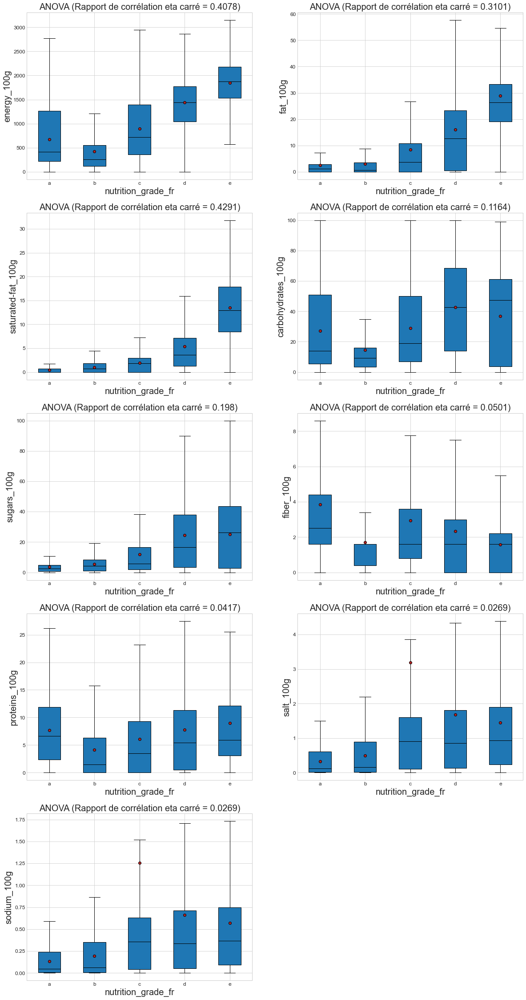

In [48]:
anova_analysis(data_selection_cleaned, 'nutrition_grade_fr', quanti)

Avec ces boîtes à moustaches on observe la répartition des classes du nutrition_grade (A à E), pour chaque variable quantitative.
On calcule ensuite le rapport de corrélation des variables (compris entre 0 et 1), qui est le rapport entre les variances interclasses et la variance totale.
Il n'y a pas corrélation si les moyennes pas classes sont toutes égales ou presque.
Il y a corrélation si les moyennes par classes sont très différentes.

On observe donc ici que les variables les plus corrélées avec le nutrition_grade sont :
- energy_100g (R = 0.4078)
- fat_100g (R=0.3101)
- saturated_fat_100g (0.4291)

Les glucides et le sucres le sont beaucoup moins :
- carbohydrates_100g (R=0.1164)
- sugars_100g (R=0.198)

Les autres nutriments ne sont pas corrélés avec le nutrition_grade

Cela correspond aux analyses précédentes et permet d'émettre les mêmes hypothèses


<a id="conclusion"></a>
## Conclusion

Cette analyse permet de mieux comprendre comment est calculé le nutri_score et le nutrition_grade.

Ce sont des indicateurs qui permettent de comparer les produits sur des critères nutritionnels, "A" correspondant à ceux de meilleure qualité nutritionnelle, et "E" au moins favorables.

D'après certaines recommentations, pour rester en bonne santé il convient d'avoir un apport journalier calorique à ne pas dépasser, et de varier les nutriments tout en favorisant les fibres, protéines, fruits et légumes ..., et limiter les produits très caloriques, les acides gras saturés, le sucre, le sel ...

Avec notre analyse on voit que les produits de meilleure qualité et meilleure pour la santé sont ceux à plus faible calorie et étant composés de fibres, ou de protéines.
Vient ensuite les produits composés d'un peu de tout les nutriments, ou salés.
Et les produits les moins bons sont les produits très sucrées ou très gras avec un très grand apport calorique.

Notre analyse correspond bien aux recommendations faites par l'agence nationale de sécurité sanitaire de l'alimentation, et nous permet de mieux comprendre l'impact des différents nutriments sur l'énergie d'un produit et son nutri_score.
